# 1. Introducción
· En este cuaderno trabajaremos en un problema de clasificación binaria de imágenes: distinguir entre caballos y humanos. \
· Usaremos tres modelos de redes neuronales convolucionales (CNN): uno personalizado desde cero, otro basado en VGG16 y otro en MobileNetV2. \
· Analizaremos su rendimiento usando un dataset estándar y también los pondremos a prueba con imágenes generadas por inteligencia artificial para comprobar su robustez ante datos no vistos.

In [ ]:
#En esta celda se guardan todas las librerías necesarias para el código del cuaderno.
import os
import numpy as np
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

from tensorflow.keras import layers, models
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16, MobileNetV2
from sklearn.metrics import classification_report, confusion_matrix

# 2. Preparación y visualización de los datos
· Utilizamos el dataset 'horses_or_humans' proporcionado por TensorFlow Datasets. \
· Dividimos el set de datos en un conjunto de entrenamiento (80%) y otro de validación (20%). \
· Las imágenes se han preprocesado redimensionándolas a 160x160 y normalizándolas para facilitar el entrenamiento de los modelos. \
· Por último, mostramos una pequeña muestra de imágenes para familiarizarnos con el tipo de datos que estamos usando.

In [3]:
(train_ds, val_ds), ds_info = tfds.load(
    'horses_or_humans',
    split=['train[:80%]', 'train[80%:]'],
    with_info=True,
    as_supervised=True
)

In [ ]:
IMG_SIZE = (160, 160)  #Requerido por MobileNetV2 y VGG16
BATCH_SIZE = 32

def preprocess(image, label):
    image = tf.image.resize(image, IMG_SIZE)
    image = image / 255.0  #Normalización de las imágenes
    return image, label

train_ds = train_ds.map(preprocess).batch(BATCH_SIZE).shuffle(1000)
val_ds = val_ds.map(preprocess).batch(BATCH_SIZE)


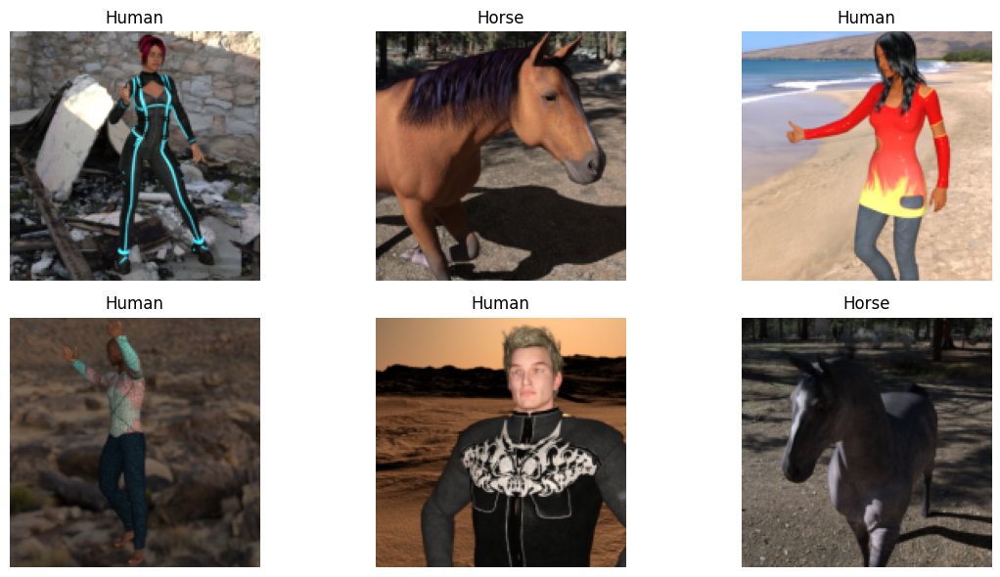

In [ ]:
#Asignamos el nombre de clase manualmente según el dataset
class_names = ['Horse', 'Human']

#Mostramos las imágenes del dataset
def mostrar_imagenes_dataset(dataset, class_names, num_images=6):
    plt.figure(figsize=(12, 6))
    for images, labels in dataset.take(1):  #Solo toma un batch (imagen)
        for i in range(num_images):
            ax = plt.subplot(2, 3, i + 1)
            plt.imshow(images[i])
            plt.title(class_names[int(labels[i])])
            plt.axis("off")
    plt.tight_layout()
    plt.show()

#Llamamos a la función para mostrar las imagenes
mostrar_imagenes_dataset(train_ds, class_names)

# 3. Creación y evaluación de modelos
· A continuación, se construyen y entrenan tres modelos diferentes:
    - Modelo Custom: una red convolucional básica construida desde cero.
    - Modelo VGG16: utilizando la arquitectura clásica preentrenada como base y adaptándola a nuestro problema.
    - Modelo MobileNetV2: una arquitectura más ligera y eficiente, también adaptada y ajustada a nuestras clases.
· Cada modelo ha sido entrenado con los datos preprocesados, evaluado con métricas como accuracy y loss, y guardado para su posterior uso en predicciones de imagenes.

## Modelo Custom

In [ ]:
#Creamos el modelo y su arquitectura y, lo compilamos
model_custom = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(160, 160, 3)),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D(2, 2),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model_custom.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])


c:\Users\Felix\venv\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#Entrenamos el modelo en 10 épocas y visualizamos los resultados obtenidos en el entrenamiento época por época
history_custom = model_custom.fit(train_ds, validation_data=val_ds, epochs=10)


Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.6460 - loss: 0.6572 - val_accuracy: 0.9463 - val_loss: 0.1171
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - accuracy: 0.9353 - loss: 0.1652 - val_accuracy: 0.9659 - val_loss: 0.0790
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.9817 - loss: 0.0552 - val_accuracy: 0.9805 - val_loss: 0.0546
Epoch 4/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.9797 - loss: 0.0492 - val_accuracy: 0.9512 - val_loss: 0.1025
Epoch 5/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.9804 - loss: 0.0692 - val_accuracy: 0.9854 - val_loss: 0.0285
Epoch 6/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.9916 - loss: 0.0242 - val_accuracy: 0.9951 - val_loss: 0.0158
Epoch 7/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.9987 - loss: 0.0084 - val_accuracy: 0.9951 - val_loss: 0.0324
Epoch 8/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - accuracy: 0.9988 - loss: 0.0054 - val_accuracy: 0.9951 -

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


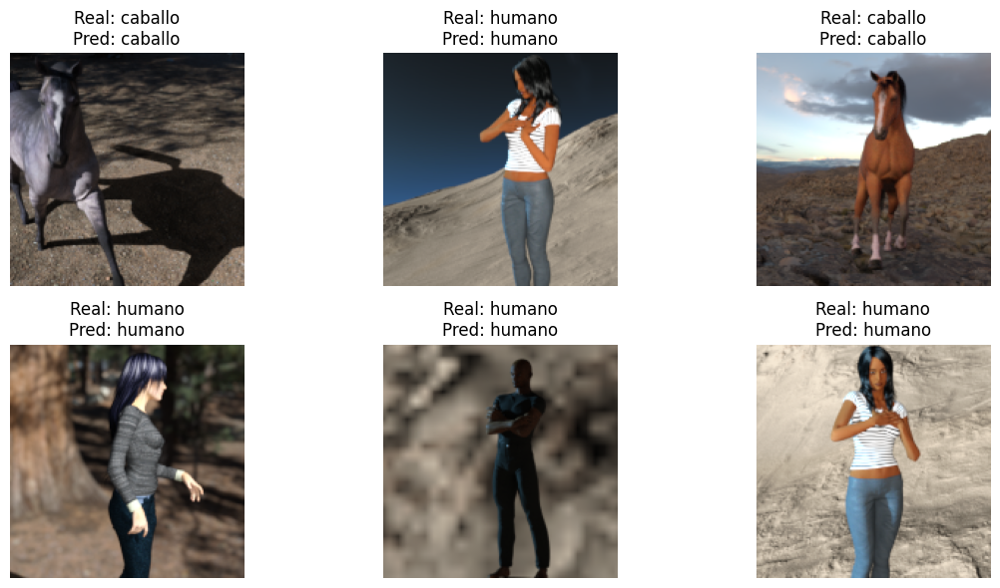

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


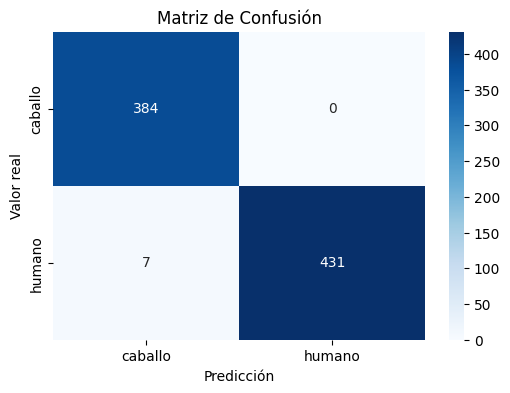

              precision    recall  f1-score   support

     caballo       0.98      1.00      0.99       384
      humano       1.00      0.98      0.99       438

    accuracy                           0.99       822
   macro avg       0.99      0.99      0.99       822
weighted avg       0.99      0.99      0.99       822



In [ ]:
#Definimos la función que nos devolverá varias métricas de error claves para visualizar como funciona el modelo con nuestros datos, además, mostraremos 6 predicciones realizadas por el modelo a modo de ejemplo
def mostrar_predicciones(modelo, dataset, class_names, num_images=6):
    plt.figure(figsize=(12, 6))
    for images, labels in dataset.take(1):
        preds = modelo.predict(images)
        for i in range(num_images):
            ax = plt.subplot(2, 3, i + 1)
            plt.imshow(images[i])
            true_label = class_names[int(labels[i])]
            pred_label = class_names[int(np.round(preds[i][0]))]
            plt.title(f"Real: {true_label}\nPred: {pred_label}")
            plt.axis("off")
    plt.tight_layout()
    plt.show()
    y_true = []
    y_pred = []

    for images, labels in dataset:
        preds = modelo.predict(images)
        preds_classes = np.argmax(preds, axis=1) if preds.shape[1] > 1 else np.round(preds).astype("int")
        y_pred.extend(preds_classes)
        y_true.extend(labels.numpy())

    #Matriz de confusión
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap="Blues")
    plt.xlabel('Predicción')
    plt.ylabel('Valor real')
    plt.title('Matriz de Confusión')
    plt.show()

    #Informe de clasificación
    print(classification_report(y_true, y_pred, target_names=class_names))

#Ejemplo con el modelo personalizado
class_names = ['caballo', 'humano']
mostrar_predicciones(model_custom, train_ds, class_names)

## Modelo Vgg-16

In [ ]:
base_vgg = VGG16(weights='imagenet', include_top=False, input_shape=(160, 160, 3))
base_vgg.trainable = False  #Congelamos pesos

model_vgg = models.Sequential([
    base_vgg,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model_vgg.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])


In [11]:
history_vgg = model_vgg.fit(train_ds, validation_data=val_ds, epochs=10)


Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 16s 586ms/step - accuracy: 0.6685 - loss: 0.6047 - val_accuracy: 0.9024 - val_loss: 0.3453
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 587ms/step - accuracy: 0.9287 - loss: 0.3091 - val_accuracy: 0.9463 - val_loss: 0.1966
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 580ms/step - accuracy: 0.9427 - loss: 0.2343 - val_accuracy: 0.9366 - val_loss: 0.1738
Epoch 4/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 585ms/step - accuracy: 0.9675 - loss: 0.1566 - val_accuracy: 0.9707 - val_loss: 0.1108
Epoch 5/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 582ms/step - accuracy: 0.9542 - loss: 0.1356 - val_accuracy: 0.9854 - val_loss: 0.0898
Epoch 6/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 583ms/step - accuracy: 0.9717 - loss: 0.1081 - val_accuracy: 0.9854 - val_loss: 0.0793
Epoch 7/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 590ms/step - accuracy: 0.9699 - loss: 0.0984 - val_accuracy: 0.9902 - val_loss: 0.0648
Epoch 8/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 15s 586ms/step - accuracy: 0.9823 - loss: 0.0749 - val_accu

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


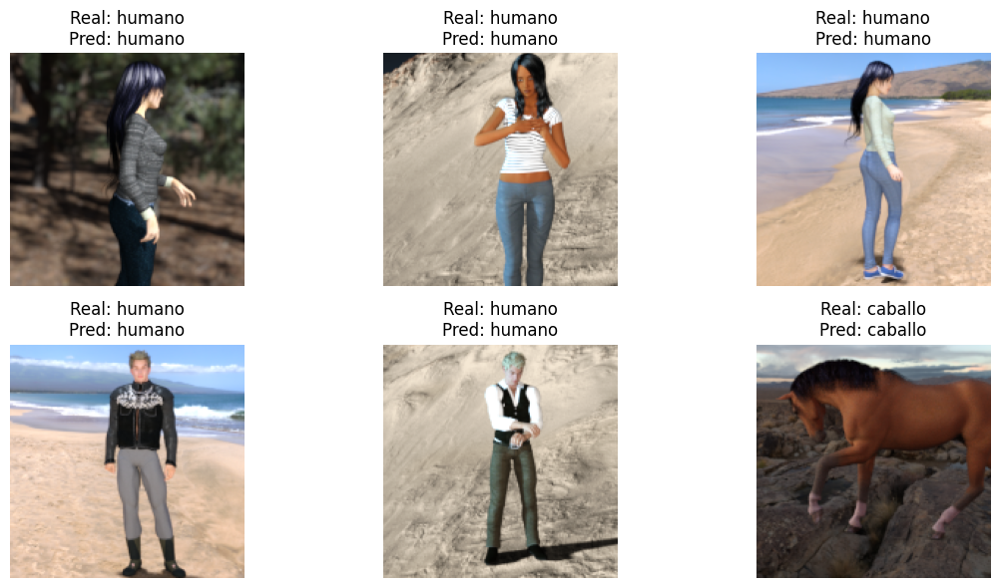

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 532ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

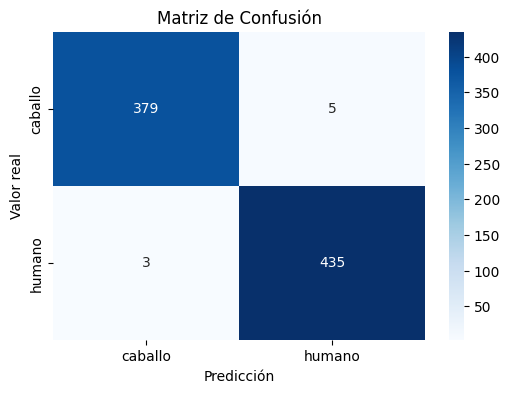

              precision    recall  f1-score   support

     caballo       0.99      0.99      0.99       384
      humano       0.99      0.99      0.99       438

    accuracy                           0.99       822
   macro avg       0.99      0.99      0.99       822
weighted avg       0.99      0.99      0.99       822



In [ ]:
def mostrar_predicciones(modelo, dataset, class_names, num_images=6):
    plt.figure(figsize=(12, 6))
    for images, labels in dataset.take(1):
        preds = modelo.predict(images)
        for i in range(num_images):
            ax = plt.subplot(2, 3, i + 1)
            plt.imshow(images[i])
            true_label = class_names[int(labels[i])]
            pred_label = class_names[int(np.round(preds[i][0]))]
            plt.title(f"Real: {true_label}\nPred: {pred_label}")
            plt.axis("off")
    plt.tight_layout()
    plt.show()
    y_true = []
    y_pred = []

    for images, labels in dataset:
        preds = modelo.predict(images)
        preds_classes = np.argmax(preds, axis=1) if preds.shape[1] > 1 else np.round(preds).astype("int")
        y_pred.extend(preds_classes)
        y_true.extend(labels.numpy())

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap="Blues")
    plt.xlabel('Predicción')
    plt.ylabel('Valor real')
    plt.title('Matriz de Confusión')
    plt.show()

    print(classification_report(y_true, y_pred, target_names=class_names))

mostrar_predicciones(model_vgg, train_ds, class_names)

## Modelo MobileNetV2

In [13]:
base_mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(160, 160, 3))
base_mobilenet.trainable = False

model_mobilenet = models.Sequential([
    base_mobilenet,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

model_mobilenet.compile(optimizer='adam',
                        loss='binary_crossentropy',
                        metrics=['accuracy'])


In [14]:
history_mobilenet = model_mobilenet.fit(train_ds, validation_data=val_ds, epochs=10)


Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.9249 - loss: 0.1949 - val_accuracy: 0.9902 - val_loss: 0.0463
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 0.9954 - loss: 0.0221 - val_accuracy: 0.9951 - val_loss: 0.0256
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 1.0000 - loss: 3.9614e-04 - val_accuracy: 0.9951 - val_loss: 0.0324
Epoch 4/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 76ms/step - accuracy: 1.0000 - loss: 7.0504e-05 - val_accuracy: 0.9951 - val_loss: 0.0343
Epoch 5/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 1.0000 - loss: 1.5711e-04 - val_accuracy: 0.9951 - val_loss: 0.0320
Epoch 6/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 1.0000 - loss: 1.4360e-04 - val_accuracy: 0.9951 - val_loss: 0.0264
Epoch 7/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 1.0000 - loss: 1.9046e-04 - val_accuracy: 0.9951 - val_loss: 0.0293
Epoch 8/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 1.0000 - loss: 7.2130e-05 -

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step


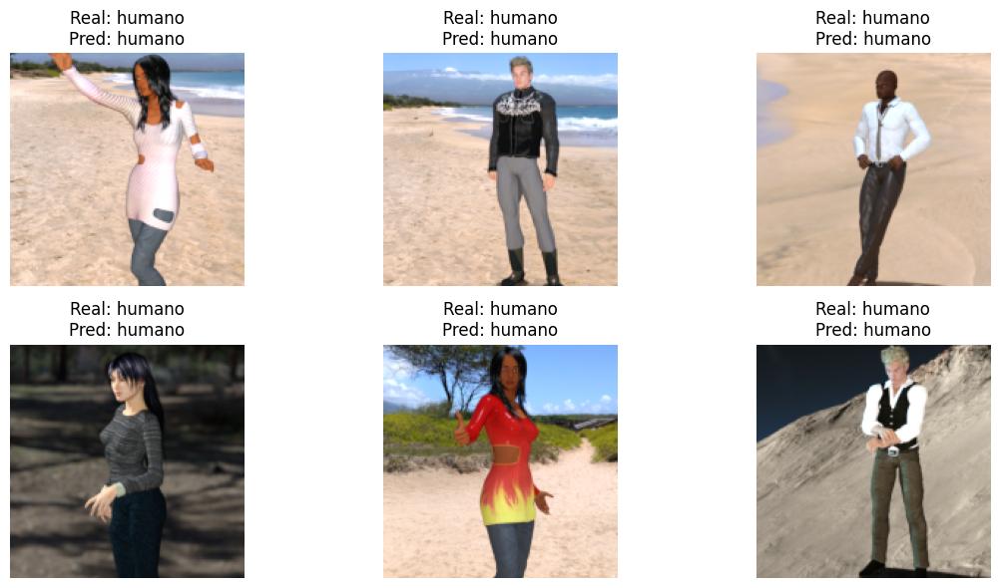

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


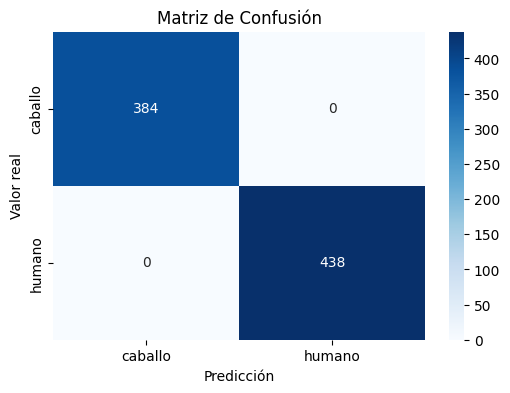

              precision    recall  f1-score   support

     caballo       1.00      1.00      1.00       384
      humano       1.00      1.00      1.00       438

    accuracy                           1.00       822
   macro avg       1.00      1.00      1.00       822
weighted avg       1.00      1.00      1.00       822



In [ ]:
def mostrar_predicciones(modelo, dataset, class_names, num_images=6):
    plt.figure(figsize=(12, 6))
    for images, labels in dataset.take(1):
        preds = modelo.predict(images)
        for i in range(num_images):
            ax = plt.subplot(2, 3, i + 1)
            plt.imshow(images[i])
            true_label = class_names[int(labels[i])]
            pred_label = class_names[int(np.round(preds[i][0]))]
            plt.title(f"Real: {true_label}\nPred: {pred_label}")
            plt.axis("off")
    plt.tight_layout()
    plt.show()
    y_true = []
    y_pred = []

    for images, labels in dataset:
        preds = modelo.predict(images)
        preds_classes = np.argmax(preds, axis=1) if preds.shape[1] > 1 else np.round(preds).astype("int")
        y_pred.extend(preds_classes)
        y_true.extend(labels.numpy())

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap="Blues")
    plt.xlabel('Predicción')
    plt.ylabel('Valor real')
    plt.title('Matriz de Confusión')
    plt.show()

    print(classification_report(y_true, y_pred, target_names=class_names))

mostrar_predicciones(model_mobilenet, train_ds, class_names)


# 4. Comparación de rendimiento mediante gráficas
· Tras entrenar los tres modelos, se han graficado las curvas de entrenamiento y validación de accuracy y loss para observar su rendimiento y detectar posibles problemas como sobreajuste. \
· Estas gráficas nos permiten comparar visualmente cuál de los modelos generaliza mejor sobre datos nuevos.

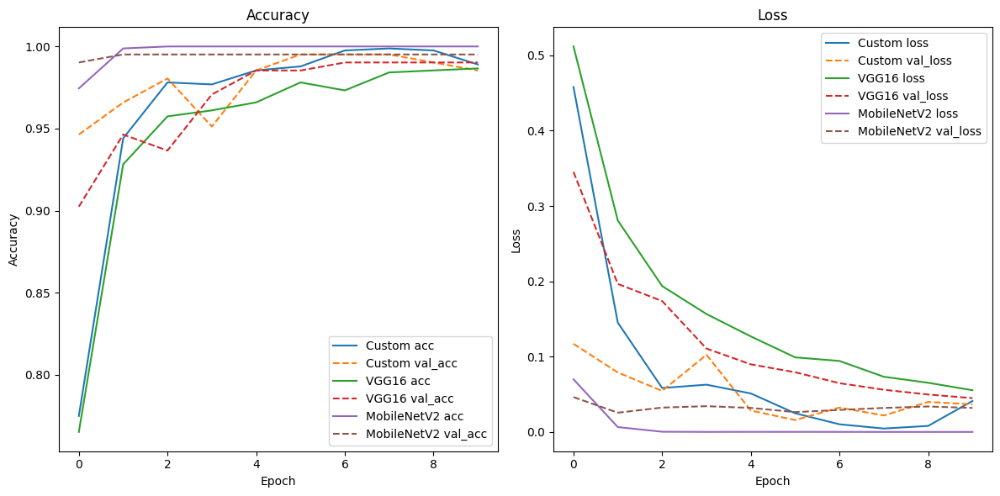

In [16]:
def plot_history(histories, titles):
    plt.figure(figsize=(12, 6))

    for i, history in enumerate(histories):
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label=f'{titles[i]} acc')
        plt.plot(history.history['val_accuracy'], linestyle='--', label=f'{titles[i]} val_acc')
        plt.title('Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label=f'{titles[i]} loss')
        plt.plot(history.history['val_loss'], linestyle='--', label=f'{titles[i]} val_loss')
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()

    plt.tight_layout()
    plt.show()

plot_history(
    [history_custom, history_vgg, history_mobilenet],
    ['Custom', 'VGG16', 'MobileNetV2']
)


El resultado de los modelos es muy bueno en general, los tres consiguen aprender muy bien de los datos y hacer predicciones muy exactas pero hay un modelo que va por delante y es MobileNetV2. \

Este modelo aprende los datos muy rápido y llega a una tasa del 100% de acierto y 0% de pérdida, lo que indica que el modelo está entrenado y, en los datos de entrenamiento o del dataset, es capaz de predecir a la perfección todas las imagenes que se le propongan. \
Esto también nos indica que es el major candidato para predecir imagenes externas al dataset de entrenameinto, pero probarremos con todos los modelos igualmente. \

Por último, el siguiente modelo con mejores métricas sería el Custom y el Vgg16, muy empatados el uno con el otro.


# 5. Pruebas con imágenes externas generadas por IA
· A continuación, probaremos los modelos con imágenes de jinetes montando a caballo generadas con inteligencia artificial, pero antes, \
 verificaremos que los modelos funcionen bien con imagenes similares a las de entrenamiento pero generadas por Sora, una inteligencia artificial. \
 
· Este experimento nos permite comprobar cómo responden los modelos ante imágenes externas y más complejas que las del dataset original.


In [ ]:
#Antes que nada, guardamos los modelos ya entrenados para su posterior uso
model_custom.save('modelo_personalizado.h5')
model_vgg.save('modelo_vgg16.h5')
model_mobilenet.save('modelo_mobilenet.h5')

In [ ]:
#Ahora vemos cuales son las medidas que se le puede ingestar a cada modelo para realizar predicciones
print(model_custom.input_shape)
print(model_mobilenet.input_shape)
print(model_vgg.input_shape)

(None, 160, 160, 3)
(None, 160, 160, 3)
(None, 160, 160, 3)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━

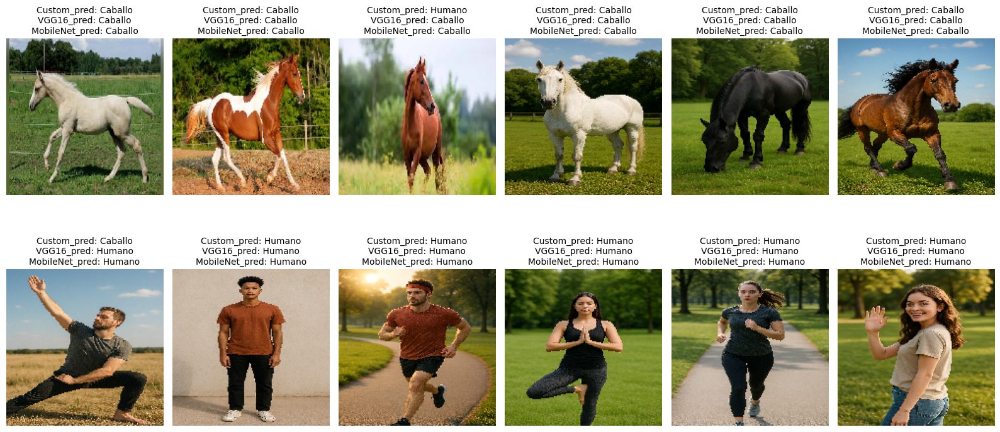

In [ ]:
#Cargar modelos previamente entrenados
model_custom = load_model("modelo_personalizado.h5")
model_vgg16 = load_model("modelo_Vgg16.h5")
model_mobilenet = load_model("modelo_mobilenet.h5")

## IMPORTANTE ##
#  #  #  #  #  # 
#Ruta de imágenes (cambiar la ruta en caso de probar el modelo con otras imagenes o, añadir la ruta correta en cada caso de uso)
ruta_imagenes = "C:\\Users\\Felix\\Desktop\\Felix\\UAX\\3º\\2 - Semestre\\5 - Visión Artificial\\Tarea2\\test_images"
#  #  #  #  #  # 


#Obtenemos la lista de archivos de imagen, es decir, añadimos las extensiones necesarias que podrían tener las imagenes que ingestaremos al modelo
archivos = [f for f in os.listdir(ruta_imagenes) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

#Creamos una figura para mostrar las 12 imágenes que el modelo procesará
plt.figure(figsize=(16, 8))

for idx, archivo in enumerate(archivos[:12]):  #Limitamos la iteración a mostrar solo 12 imágenes (en nuestro caso es todas las que tenemos, pero se puede modificar)
    ruta_completa = os.path.join(ruta_imagenes, archivo)

    #Cargamos la imagen y preparamos el array de la imagen
    img = image.load_img(ruta_completa, target_size=(160, 160))  #Ahora usaremos este tamaño ya que el 'modelo custom' solo admite este tamaño, MobileNet y Vgg16 admiten tamaños más grandes y luego los procesaremos por separado
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0

    #Realizamos las predicciones de cada modelo
    pred_custom = model_custom.predict(img_array)[0][0]
    pred_vgg16 = model_vgg16.predict(img_array)[0][0]
    pred_mobilenet = model_mobilenet.predict(img_array)[0][0]

    #Convertimos la predicción en una etiqueta para mostrar los datos
    etiqueta = lambda p: "Humano" if p > 0.5 else "Caballo"

    #Mostramos las imagenes y sus respectivas predicciones
    plt.subplot(2, 6, idx+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Custom_pred: {etiqueta(pred_custom)}\n"
              f"VGG16_pred: {etiqueta(pred_vgg16)}\n"
              f"MobileNet_pred: {etiqueta(pred_mobilenet)}",
              fontsize=10)

plt.tight_layout()
plt.show()

· Observamos que los resultados generales son muy buenos para los tres modelos, pero, apreciamos que el modelo custom tiende a equivocarse levemente. \

· Una vez visto que los modelos funcionan con datos (imagenes) nuevas o nunca vistas, entonces podremos pasar al procesamiento y predicción de las imágenes de jinetes a caballo.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


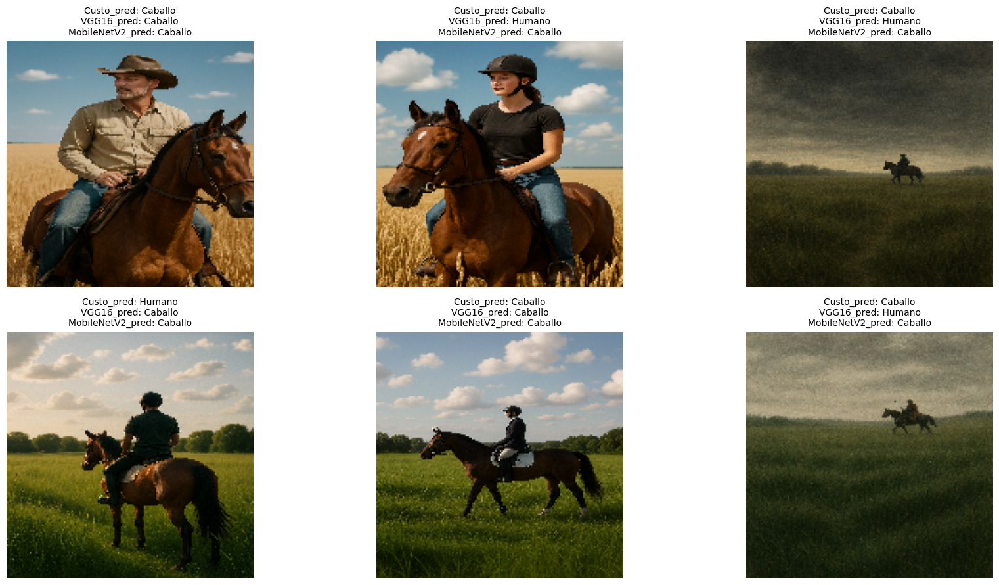

In [ ]:
#Cargamos los modelos
modelo_custom = load_model('modelo_personalizado.h5')
modelo_vgg16 = load_model('modelo_vgg16.h5')
modelo_mobilenet = load_model('modelo_mobilenet.h5')

## IMPORTANTE ##
#  #  #  #  #  # 
#Ruta de imágenes (cambiar la ruta en caso de probar el modelo con otras imagenes o, añadir la ruta correta en cada caso de uso)
ruta_imagenes = "C:\\Users\\Felix\\Desktop\\Felix\\UAX\\3º\\2 - Semestre\\5 - Visión Artificial\\Tarea2\\jinetes_dataset"
#  #  #  #  #  # 

n_imagenes = 6

#Obtenemos los nombres de los archivos (solo los primeros 6)
nombres_archivos = sorted(os.listdir(ruta_imagenes))[:n_imagenes]

#Ajustamos el tamaño de entrada de las imágenes (puede ser ajustado si es necesario, más tarde lo haremos)
target_size = (160, 160)

#Creamos la figura que mostrará las imágenes
plt.figure(figsize=(18, 9))

for i, nombre_archivo in enumerate(nombres_archivos):
    ruta_completa = os.path.join(ruta_imagenes, nombre_archivo)
    
    img = image.load_img(ruta_completa, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    
    pred_custom = modelo_custom.predict(img_array)[0][0]
    pred_vgg16 = modelo_vgg16.predict(img_array)[0][0]
    pred_mobilenet = modelo_mobilenet.predict(img_array)[0][0]
    
    label_custom = "Humano" if pred_custom > 0.5 else "Caballo"
    label_vgg16 = "Humano" if pred_vgg16 > 0.5 else "Caballo"
    label_mobilenet = "Humano" if pred_mobilenet > 0.5 else "Caballo"
    
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"Custo_pred: {label_custom}\n"
        f"VGG16_pred: {label_vgg16}\n"
        f"MobileNetV2_pred: {label_mobilenet}",
        fontsize=10
    )

plt.tight_layout()
plt.show()

· Ahora podemos observar que los tres modelos tienden a visualizar al caballo en vez de al humano en la imagen, a pesar de que las 6 imágenes sean distitnas, con entornos y formatos distinto.\
· Especialmente, el modelo Vgg16 tiene 3 predicciones en como humano y 3 predicciones como caballo.

# 6. Evaluación con resolución aumentada y conclusiones
· Finalmente, seleccionamos seis imágenes generadas de jinetes montados a caballo y analizamos cómo las clasifica cada modelo. \
· Comparamos los resultados entre los tres modelos y repetimos el experimento con imágenes de mayor resolución (420x420) para VGG16 y MobileNet para ver si sacamos información relevante.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


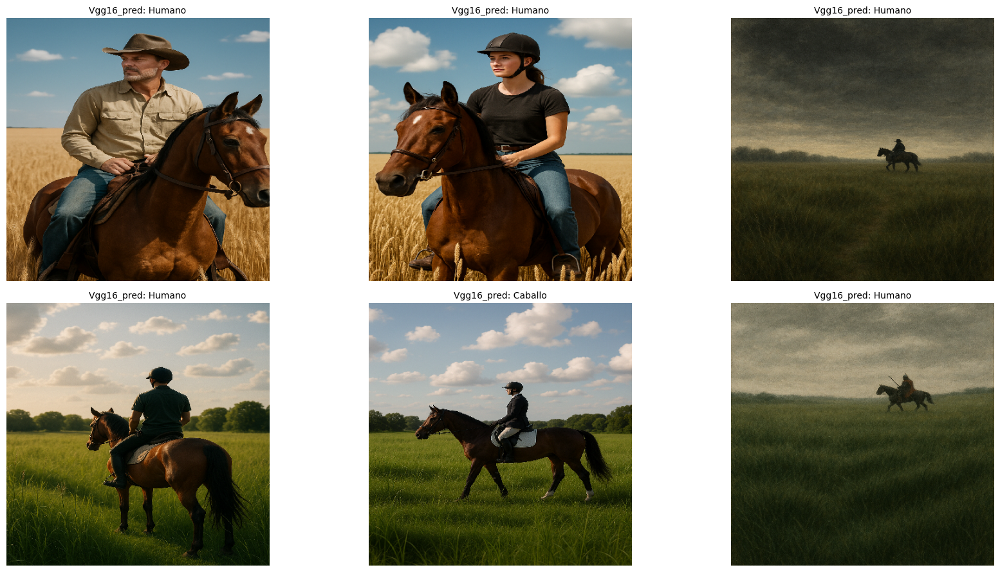

In [ ]:
#Cargamos el modelo a usar
modelo = model_vgg 

ruta_imagenes = "C:\\Users\\Felix\\Desktop\\Felix\\UAX\\3º\\2 - Semestre\\5 - Visión Artificial\\Tarea2\\jinetes_dataset"
n_imagenes = 6

nombres_archivos = sorted(os.listdir(ruta_imagenes))[:n_imagenes]

#Ajustamos el tamaño de entrada de las imágenes a una resolución bastante más elevada, para ver que sucede al tener más información que evaluar.
target_size = (450, 450)

plt.figure(figsize=(18, 9))

for i, nombre_archivo in enumerate(nombres_archivos):
    ruta_completa = os.path.join(ruta_imagenes, nombre_archivo)
    
    img = image.load_img(ruta_completa, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    
    pred = modelo.predict(img_array)[0][0]
    
    label = "Humano" if pred > 0.5 else "Caballo"
    
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"Vgg16_pred: {label}",
        fontsize=10
    )

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


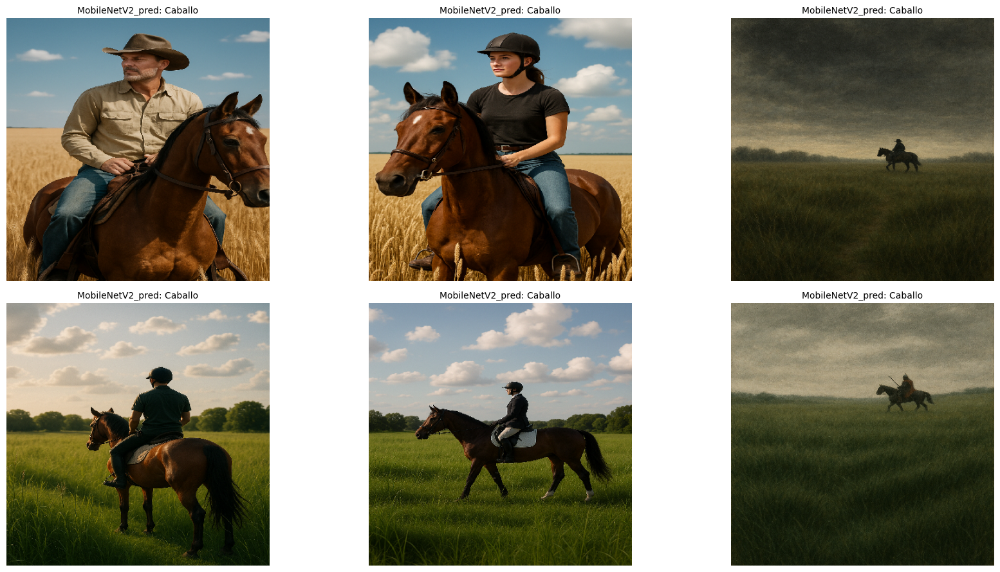

In [ ]:
#Hacemos lo mismo con el otro modelo
modelo = model_mobilenet 

ruta_imagenes = "C:\\Users\\Felix\\Desktop\\Felix\\UAX\\3º\\2 - Semestre\\5 - Visión Artificial\\Tarea2\\jinetes_dataset"
n_imagenes = 6

nombres_archivos = sorted(os.listdir(ruta_imagenes))[:n_imagenes]

target_size = (450, 450)

plt.figure(figsize=(18, 9))

for i, nombre_archivo in enumerate(nombres_archivos):
    ruta_completa = os.path.join(ruta_imagenes, nombre_archivo)

    img = image.load_img(ruta_completa, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    
    pred = modelo.predict(img_array)[0][0]
    
    label = "Humano" if pred > 0.5 else "Caballo"
    
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(
        f"MobileNetV2_pred: {label}",
        fontsize=10
    )

plt.tight_layout()
plt.show()

Al realizar esta prueba, podemos observar que el modelo Vgg-16, al tener una resolución de la imágen más elevada, tiende a detectar antes al humano que al caballo en las imágenes. \
En cambio, en el modelo MobileNetV2 podemos visualizar que las predicciones se decantan totalmente por detectar antes al caballo que al jinete, en todas las muestras.

# 7. Respuesta a la pregunta planteada en la tarea
Busca en internet algunas imágenes de fuera del dataset conteniendo imágenes de jinetes montados a caballo
- ¿cómo las clasifican los modelos desarrollados? 
- ¿Habría alguna forma de ajustar los modelos para que no fallen en la detección de caballos, aunque ello conlleve que algunas imágenes de humanos puedan ser mal clasificadas?

Según los resultados obtenidos, podemos afirmar lo siguiente:

Se utilizaron imágenes generadas por inteligencia artificial (Sora) que muestran jinetes montados a caballo, es decir, una combinación simultánea de humano y caballo. \
Estas imágenes no forman parte del conjunto original de entrenamiento, que solo contenía humanos o caballos de forma individual. 

Los resultados de los modelos fueron los siguientes: 
- MobileNetV2: Clasifica todas las imágenes como caballo, tanto en resoluciones de 160x160 como de 420x420. Esto sugiere que el modelo da más peso a las características visuales del caballo que al jinete. 
- VGG16: Con resolución de 160x160, ofrece resultados variados (detecta humanos y caballos). Sin embargo, al aumentar la resolución a 420x420, clasifica todas las imágenes como humano, \
      posiblemente porque en alta resolución el modelo detecta más rasgos humanos dominantes (cara, cuerpo, postura).
- Modelo personalizado (CNN propia): Solo funciona en resolución 160x160 y da predicciones variadas, aunque menos consistentes.

¿Cómo ajustar los modelos para mejorar la detección de caballos aunque haya humanos presentes? 

Una posible solución sería modificar el enfoque de clasificación para adaptarlo a imágenes que contienen más de una clase (en este caso, humano + caballo). \
Algunas estrategias: 
- Redefinir el problema como detección multiclase o multilabel, en lugar de binaria. En vez de forzar una única clase (caballo o humano), el modelo puede marcar si hay uno, ambos o ninguno presentes. 
- Ampliar el conjunto de entrenamiento incluyendo imágenes de jinetes (humanos montados en caballos), tanto reales como generadas. Esto ayuda al modelo a aprender los patrones combinados.
- Aplicar técnicas de fine-tuning sobre los modelos preentrenados (como MobileNet o VGG16) usando un dataset con ejemplos de jinetes para ajustar sus pesos a este nuevo contexto.
- Incluir segmentación o detección de objetos con modelos como YOLO o Mask R-CNN, que permiten identificar y diferenciar múltiples objetos en una misma imagen, en lugar de realizar clasificación global.
